# PCB Component Segmentation Training

PyTorch for a segmentation model on the PCB dataset for metal/non-metal component segmentation.

---

**Running in Google Colab:**
1. Upload your notebook to Colab
2. Upload your HDF5 data files to Google Drive at: `My Drive/pcb-dataset/data/output/`
3. Run all cells - it will auto-detect Colab and mount Google Drive
4. Make sure to enable GPU: Runtime → Change runtime type → GPU (T4 or better)

**Running Locally:**
- Just run the cells normally - it will use `../data/output/`

---

## Setup & Installation

In [ ]:
!pip install torch torchvision h5py matplotlib numpy pillow tensorboard

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import h5py
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")

PyTorch version: 2.9.0+cu126
CUDA available: True
CUDA device: Tesla T4


## Environment Setup (Colab or Local)

In [2]:
# Detect if running in Google Colab
try:
    import google.colab
    IN_COLAB = True
    print("Running in Google Colab")
except:
    IN_COLAB = False
    print("Running locally")

# Mount Google Drive if in Colab
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

    # Set data directory to Google Drive
    # NOTE: Upload your data to Google Drive at: My Drive/pcb-dataset/data/output/
    data_dir = Path("/content/drive/MyDrive/pcb-dataset/data/output")

    print(f"\n*** IMPORTANT ***")
    print(f"Make sure your HDF5 files are uploaded to:")
    print(f"  {data_dir}")
    print(f"You can change this path below if your data is in a different location.")
else:
    # Local environment
    data_dir = Path("../data/output")

print(f"\nData directory: {data_dir}")
print(f"Exists: {data_dir.exists()}")

Running in Google Colab
Mounted at /content/drive

*** IMPORTANT ***
Make sure your HDF5 files are uploaded to:
  /content/drive/MyDrive/pcb-dataset/data/output
You can change this path below if your data is in a different location.

Data directory: /content/drive/MyDrive/pcb-dataset/data/output
Exists: True


## Dataset Download

In [3]:
# Count HDF5 files in the data directory
hdf5_files = sorted(list(data_dir.glob("*.hdf5")))
print(f"Found {len(hdf5_files)} HDF5 files")

if len(hdf5_files) == 0:
    print("\n*** WARNING: No HDF5 files found! ***")
    if IN_COLAB:
        print("Please upload your data to Google Drive at:")
        print(f"  {data_dir}")
    else:
        print(f"Please check that data exists at: {data_dir}")

Found 695 HDF5 files


## Data Exploration

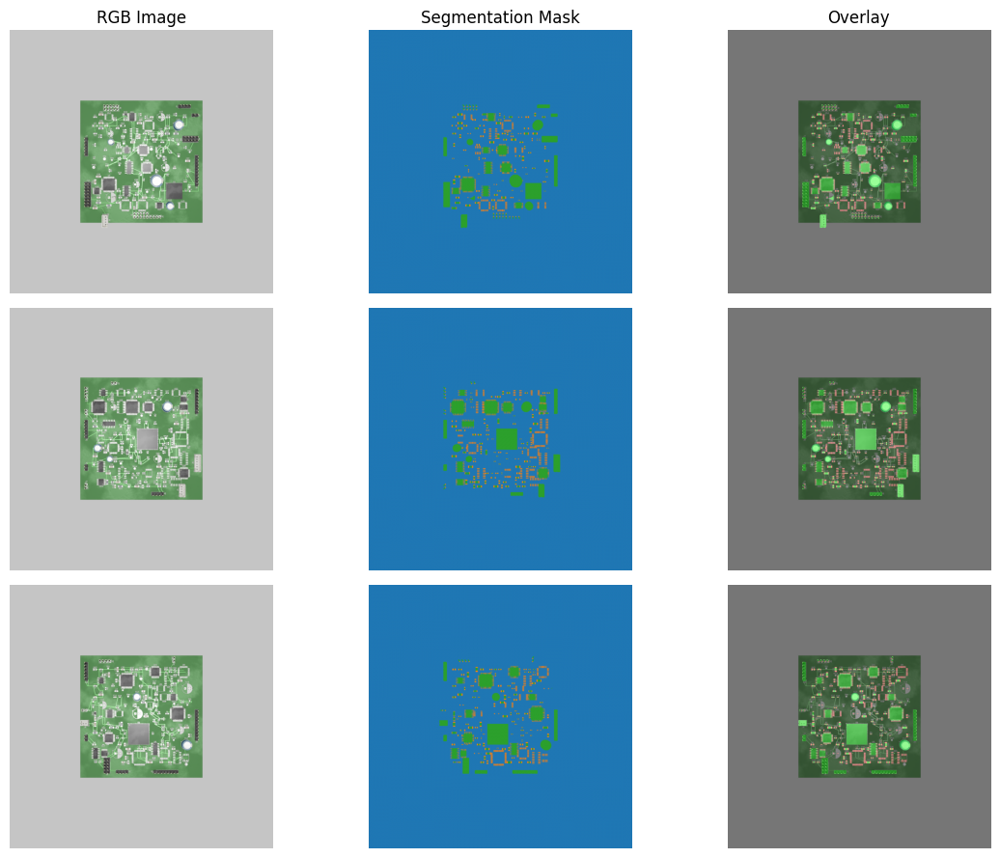


Displayed 3 out of 695 total samples


In [4]:
# Visualize multiple samples
num_samples = min(3, len(hdf5_files))
fig, axes = plt.subplots(num_samples, 3, figsize=(12, 3 * num_samples))
if num_samples == 1:
    axes = axes.reshape(1, -1)

for idx in range(num_samples):
    with h5py.File(hdf5_files[idx], "r") as f:
        image = f["colors"][:]
        seg_mask = f["category_id_segmaps"][:]

    # RGB Image
    axes[idx, 0].imshow(image)
    if idx == 0:
        axes[idx, 0].set_title("RGB Image")
    axes[idx, 0].set_ylabel(f"Sample {idx}", fontsize=10)
    axes[idx, 0].axis("off")

    # Segmentation mask
    axes[idx, 1].imshow(seg_mask, cmap="tab10", vmin=0, vmax=10)
    if idx == 0:
        axes[idx, 1].set_title("Segmentation Mask")
    axes[idx, 1].axis("off")

    # Overlay
    mask_colored = np.zeros_like(image)
    mask_colored[seg_mask == 1] = [255, 0, 0]
    mask_colored[seg_mask == 2] = [0, 255, 0]
    overlay = (0.6 * image + 0.4 * mask_colored).astype(np.uint8)
    axes[idx, 2].imshow(overlay)
    if idx == 0:
        axes[idx, 2].set_title("Overlay")
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()

print(f"\nDisplayed {num_samples} out of {len(hdf5_files)} total samples")

## Filter Corrupted Files

In [5]:
# Check for corrupted HDF5 files and filter them out
print("Checking file integrity...")
print(f"Total files found: {len(hdf5_files)}")

corrupted_files = []
valid_files = []

for i, filepath in enumerate(hdf5_files):
    # Show progress every 50 files
    if (i + 1) % 50 == 0 or (i + 1) == len(hdf5_files):
        print(f"  Checked {i + 1}/{len(hdf5_files)} files...", end='\r')

    try:
        with h5py.File(filepath, 'r') as f:
            # Try to read the critical datasets we need for training
            _ = f["colors"][0:1, 0:1, :]  # Read a small slice to test
            _ = f["category_id_segmaps"][0:1, 0:1]  # Read a small slice to test

        # If we got here, file is readable
        valid_files.append(filepath)

    except (OSError, KeyError, Exception) as e:
        # File is corrupted or missing required datasets
        corrupted_files.append((filepath, str(e)))

print()  # New line after progress
print(f"\nIntegrity check complete!")
print(f"  ✓ Valid files: {len(valid_files)}")
print(f"  ✗ Corrupted files: {len(corrupted_files)}")

if corrupted_files:
    print(f"\n⚠️  Found {len(corrupted_files)} corrupted files - filtering them out:")
    for filepath, error in corrupted_files[:5]:  # Show first 5
        print(f"  - {filepath.name}: {error[:80]}")
    if len(corrupted_files) > 5:
        print(f"  ... and {len(corrupted_files) - 5} more")

    # Replace hdf5_files with only valid files
    hdf5_files = valid_files
    print(f"\nProceeding with {len(hdf5_files)} valid files")
else:
    print("\n✓ All files are valid!")

print(f"\nFinal dataset size: {len(hdf5_files)} files")

Checking file integrity...
Total files found: 695
  Checked 695/695 files...

Integrity check complete!
  ✓ Valid files: 689
  ✗ Corrupted files: 6

⚠️  Found 6 corrupted files - filtering them out:
  - sample_000317_1024x1024.hdf5: Can't synchronously read data (filter returned failure during read)
  - sample_000458_1024x1024.hdf5: Can't synchronously read data (filter returned failure during read)
  - sample_000467_1024x1024.hdf5: Can't synchronously read data (filter returned failure during read)
  - sample_000650_1024x1024.hdf5: Can't synchronously read data (filter returned failure during read)
  - sample_000969_1024x1024.hdf5: Can't synchronously read data (filter returned failure during read)
  ... and 1 more

Proceeding with 689 valid files

Final dataset size: 689 files


## Train/Val/Test Split

In [6]:
# Custom Dataset class for PCB segmentation
import torchvision.transforms.functional as TF
import random

class PCBSegmentationDataset(Dataset):
    def __init__(self, hdf5_files, crop_size=256, augment=True):
        self.hdf5_files = hdf5_files
        self.crop_size = crop_size
        self.augment = augment

    def __len__(self):
        return len(self.hdf5_files)

    def __getitem__(self, idx):
        with h5py.File(self.hdf5_files[idx], "r") as f:
            # Load image and mask
            image = f["colors"][:]  # (1024, 1024, 3)
            mask = f["category_id_segmaps"][:]  # (1024, 1024)

        # Convert to tensor and normalize
        # Image: (H, W, C) -> (C, H, W), normalize to [0, 1]
        image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        mask = torch.from_numpy(mask).long()

        # Random crop to crop_size x crop_size
        if self.crop_size is not None:
            # Get image dimensions
            _, h, w = image.shape

            # Calculate random crop position
            top = random.randint(0, h - self.crop_size)
            left = random.randint(0, w - self.crop_size)

            # Apply same crop to both image and mask
            image = TF.crop(image, top, left, self.crop_size, self.crop_size)
            mask = TF.crop(mask.unsqueeze(0), top, left, self.crop_size, self.crop_size).squeeze(0)

        # Optional: Additional augmentations during training
        if self.augment:
            # Random horizontal flip
            if random.random() > 0.5:
                image = TF.hflip(image)
                mask = TF.hflip(mask.unsqueeze(0)).squeeze(0)

            # Random vertical flip
            if random.random() > 0.5:
                image = TF.vflip(image)
                mask = TF.vflip(mask.unsqueeze(0)).squeeze(0)

        return image, mask

# Split dataset: 70% train, 20% val, 10% test
np.random.seed(42)
indices = np.random.permutation(len(hdf5_files))

train_size = int(0.7 * len(hdf5_files))
val_size = int(0.2 * len(hdf5_files))
test_size = len(hdf5_files) - train_size - val_size

train_indices = indices[:train_size]
val_indices = indices[train_size:train_size + val_size]
test_indices = indices[train_size + val_size:]

train_files = [hdf5_files[i] for i in train_indices]
val_files = [hdf5_files[i] for i in val_indices]
test_files = [hdf5_files[i] for i in test_indices]

print(f"Dataset split:")
print(f"  Train: {len(train_files)} samples ({100*len(train_files)/len(hdf5_files):.1f}%)")
print(f"  Val:   {len(val_files)} samples ({100*len(val_files)/len(hdf5_files):.1f}%)")
print(f"  Test:  {len(test_files)} samples ({100*len(test_files)/len(hdf5_files):.1f}%)")

# Create datasets with 256x256 random crops
CROP_SIZE = 256
print(f"\nUsing random crops of size: {CROP_SIZE}x{CROP_SIZE}")
print(f"Memory reduction: ~{(1024/CROP_SIZE)**2:.1f}x compared to full 1024x1024 images")

train_dataset = PCBSegmentationDataset(train_files, crop_size=CROP_SIZE, augment=True)
val_dataset = PCBSegmentationDataset(val_files, crop_size=CROP_SIZE, augment=False)
test_dataset = PCBSegmentationDataset(test_files, crop_size=CROP_SIZE, augment=False)

# Create dataloaders - num_workers=0 to avoid HDF5 multiprocessing issues
batch_size = 4
num_workers = 0  # IMPORTANT: HDF5 files don't work well with multiprocessing

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

print(f"\nDataLoader info:")
print(f"  Batch size: {batch_size}")
print(f"  Num workers: {num_workers} (single-threaded to avoid HDF5 issues)")
print(f"  Train batches: {len(train_loader)}")
print(f"  Val batches: {len(val_loader)}")
print(f"  Test batches: {len(test_loader)}")

# Test loading a batch
sample_batch = next(iter(train_loader))
print(f"\nSample batch shapes:")
print(f"  Images: {sample_batch[0].shape}")  # (B, C, H, W)
print(f"  Masks: {sample_batch[1].shape}")   # (B, H, W)
print(f"\nData augmentation enabled for training: horizontal/vertical flips")

Dataset split:
  Train: 482 samples (70.0%)
  Val:   137 samples (19.9%)
  Test:  70 samples (10.2%)

Using random crops of size: 256x256
Memory reduction: ~16.0x compared to full 1024x1024 images

DataLoader info:
  Batch size: 4
  Num workers: 0 (single-threaded to avoid HDF5 issues)
  Train batches: 121
  Val batches: 35
  Test batches: 18

Sample batch shapes:
  Images: torch.Size([4, 3, 256, 256])
  Masks: torch.Size([4, 256, 256])

Data augmentation enabled for training: horizontal/vertical flips


## Model Architecture

In [7]:
# Clear GPU memory before creating model
import gc

# Delete any existing model
if 'model' in globals():
    del model

# Clear Python garbage
gc.collect()

# Clear CUDA cache
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.synchronize()

    # Show memory status
    print("GPU Memory Status:")
    print(f"  Allocated: {torch.cuda.memory_allocated() / 1e9:.2f} GB")
    print(f"  Reserved: {torch.cuda.memory_reserved() / 1e9:.2f} GB")
    print(f"  Free: {(torch.cuda.get_device_properties(0).total_memory - torch.cuda.memory_allocated()) / 1e9:.2f} GB")
else:
    print("CUDA not available")

GPU Memory Status:
  Allocated: 0.00 GB
  Reserved: 0.00 GB
  Free: 15.83 GB


In [8]:
# U-Net Architecture for Semantic Segmentation
class DoubleConv(nn.Module):
    """Double convolution block: (Conv -> BN -> ReLU) x 2"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    """U-Net architecture for segmentation"""
    def __init__(self, in_channels=3, num_classes=3):
        super().__init__()

        # Encoder (downsampling)
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder (upsampling)
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Final output
        self.out = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        e4 = self.enc4(p3)
        p4 = self.pool4(e4)

        # Bottleneck
        b = self.bottleneck(p4)

        # Decoder with skip connections
        d4 = self.up4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)

        d3 = self.up3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        # Output
        out = self.out(d1)
        return out

# Initialize model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(in_channels=3, num_classes=3).to(device)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Model: U-Net")
print(f"Device: {device}")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

# Test forward pass with 256x256 (matching our training size to save GPU memory)
test_input = torch.randn(1, 3, 256, 256).to(device)
test_output = model(test_input)
print(f"\nTest forward pass:")
print(f"  Input shape: {test_input.shape}")
print(f"  Output shape: {test_output.shape}")
print(f"  Expected: (1, 3, 256, 256)")
print(f"  Match: {test_output.shape == torch.Size([1, 3, 256, 256])}")

# Clean up test tensors to free GPU memory for training
del test_input, test_output
torch.cuda.empty_cache()
print(f"\nGPU memory after cleanup: {torch.cuda.memory_allocated() / 1e9:.2f} GB")

Model: U-Net
Device: cuda
Total parameters: 31,043,651
Trainable parameters: 31,043,651

Test forward pass:
  Input shape: torch.Size([1, 3, 256, 256])
  Output shape: torch.Size([1, 3, 256, 256])
  Expected: (1, 3, 256, 256)
  Match: True

GPU memory after cleanup: 0.13 GB


## Training Configuration

In [9]:
# Training configuration
from torch.utils.tensorboard import SummaryWriter
import time

# Hyperparameters
num_epochs = 50
learning_rate = 1e-4
weight_decay = 1e-5

# Loss function - CrossEntropyLoss for multi-class segmentation
criterion = nn.CrossEntropyLoss()

# Optimizer - Adam
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

# Learning rate scheduler - ReduceLROnPlateau
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5
)

# TensorBoard writer
log_dir = f"runs/pcb_segmentation_{time.strftime('%Y%m%d_%H%M%S')}"
writer = SummaryWriter(log_dir)

print("Training Configuration:")
print(f"  Epochs: {num_epochs}")
print(f"  Learning rate: {learning_rate}")
print(f"  Weight decay: {weight_decay}")
print(f"  Optimizer: Adam")
print(f"  Loss function: CrossEntropyLoss")
print(f"  LR Scheduler: ReduceLROnPlateau (factor=0.5, patience=5)")
print(f"  TensorBoard log dir: {log_dir}")

# Metric functions
def calculate_iou(pred, target, num_classes=3):
    """Calculate IoU (Intersection over Union) for each class"""
    ious = []
    pred = pred.view(-1)
    target = target.view(-1)

    for cls in range(num_classes):
        pred_inds = pred == cls
        target_inds = target == cls
        intersection = (pred_inds & target_inds).sum().float()
        union = (pred_inds | target_inds).sum().float()

        if union == 0:
            ious.append(float('nan'))
        else:
            ious.append((intersection / union).item())

    return ious

def calculate_dice(pred, target, num_classes=3):
    """Calculate Dice coefficient for each class"""
    dice_scores = []
    pred = pred.view(-1)
    target = target.view(-1)

    for cls in range(num_classes):
        pred_inds = pred == cls
        target_inds = target == cls
        intersection = (pred_inds & target_inds).sum().float()

        dice = (2. * intersection) / (pred_inds.sum() + target_inds.sum()).float()
        dice_scores.append(dice.item() if not torch.isnan(dice) else float('nan'))

    return dice_scores

def pixel_accuracy(pred, target):
    """Calculate pixel-wise accuracy"""
    correct = (pred == target).sum().float()
    total = target.numel()
    return (correct / total).item()

print("\nMetrics defined:")
print("  - IoU (Intersection over Union)")
print("  - Dice coefficient")
print("  - Pixel accuracy")

Training Configuration:
  Epochs: 50
  Learning rate: 0.0001
  Weight decay: 1e-05
  Optimizer: Adam
  Loss function: CrossEntropyLoss
  LR Scheduler: ReduceLROnPlateau (factor=0.5, patience=5)
  TensorBoard log dir: runs/pcb_segmentation_20251217_044216

Metrics defined:
  - IoU (Intersection over Union)
  - Dice coefficient
  - Pixel accuracy


## Training Loop with TensorBoard

In [10]:
# Training and validation functions
def train_epoch(model, loader, criterion, optimizer, device):
    """Train for one epoch"""
    model.train()
    total_loss = 0
    total_iou = [0, 0, 0]
    total_dice = [0, 0, 0]
    total_acc = 0
    num_batches = 0

    for batch_idx, (images, masks) in enumerate(loader):
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Calculate metrics
        preds = outputs.argmax(dim=1)
        batch_iou = calculate_iou(preds, masks)
        batch_dice = calculate_dice(preds, masks)
        batch_acc = pixel_accuracy(preds, masks)

        total_loss += loss.item()
        for i in range(3):
            if not np.isnan(batch_iou[i]):
                total_iou[i] += batch_iou[i]
            if not np.isnan(batch_dice[i]):
                total_dice[i] += batch_dice[i]
        total_acc += batch_acc
        num_batches += 1

        # Print progress
        if (batch_idx + 1) % 20 == 0:
            print(f"  Batch [{batch_idx+1}/{len(loader)}] - Loss: {loss.item():.4f}")

    avg_loss = total_loss / num_batches
    avg_iou = [iou / num_batches for iou in total_iou]
    avg_dice = [dice / num_batches for dice in total_dice]
    avg_acc = total_acc / num_batches

    return avg_loss, avg_iou, avg_dice, avg_acc

def validate(model, loader, criterion, device):
    """Validate the model"""
    model.eval()
    total_loss = 0
    total_iou = [0, 0, 0]
    total_dice = [0, 0, 0]
    total_acc = 0
    num_batches = 0

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Calculate metrics
            preds = outputs.argmax(dim=1)
            batch_iou = calculate_iou(preds, masks)
            batch_dice = calculate_dice(preds, masks)
            batch_acc = pixel_accuracy(preds, masks)

            total_loss += loss.item()
            for i in range(3):
                if not np.isnan(batch_iou[i]):
                    total_iou[i] += batch_iou[i]
                if not np.isnan(batch_dice[i]):
                    total_dice[i] += batch_dice[i]
            total_acc += batch_acc
            num_batches += 1

    avg_loss = total_loss / num_batches
    avg_iou = [iou / num_batches for iou in total_iou]
    avg_dice = [dice / num_batches for dice in total_dice]
    avg_acc = total_acc / num_batches

    return avg_loss, avg_iou, avg_dice, avg_acc

# Training loop
best_val_loss = float('inf')
best_model_path = 'best_model.pth'
history = {
    'train_loss': [], 'val_loss': [],
    'train_iou': [], 'val_iou': [],
    'train_dice': [], 'val_dice': [],
    'train_acc': [], 'val_acc': []
}

print("Starting training...\n")
start_time = time.time()

for epoch in range(num_epochs):
    print(f"Epoch [{epoch+1}/{num_epochs}]")

    # Train
    train_loss, train_iou, train_dice, train_acc = train_epoch(
        model, train_loader, criterion, optimizer, device
    )

    # Validate
    val_loss, val_iou, val_dice, val_acc = validate(
        model, val_loader, criterion, device
    )

    # Update learning rate
    scheduler.step(val_loss)

    # Log to TensorBoard
    writer.add_scalar('Loss/train', train_loss, epoch)
    writer.add_scalar('Loss/val', val_loss, epoch)
    writer.add_scalar('Accuracy/train', train_acc, epoch)
    writer.add_scalar('Accuracy/val', val_acc, epoch)

    for i in range(3):
        writer.add_scalar(f'IoU/train_class_{i}', train_iou[i], epoch)
        writer.add_scalar(f'IoU/val_class_{i}', val_iou[i], epoch)
        writer.add_scalar(f'Dice/train_class_{i}', train_dice[i], epoch)
        writer.add_scalar(f'Dice/val_class_{i}', val_dice[i], epoch)

    writer.add_scalar('LearningRate', optimizer.param_groups[0]['lr'], epoch)

    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_iou'].append(train_iou)
    history['val_iou'].append(val_iou)
    history['train_dice'].append(train_dice)
    history['val_dice'].append(val_dice)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)

    # Print epoch summary
    print(f"  Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
    print(f"  Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")
    print(f"  Train mIoU: {np.mean(train_iou):.4f} | Val mIoU: {np.mean(val_iou):.4f}")
    print(f"  LR: {optimizer.param_groups[0]['lr']:.6f}\n")

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
        }, best_model_path)
        print(f"  *** Saved best model (val_loss: {val_loss:.4f}) ***\n")

training_time = time.time() - start_time
print(f"Training completed in {training_time/60:.2f} minutes")
print(f"Best validation loss: {best_val_loss:.4f}")
print(f"Best model saved to: {best_model_path}")

writer.close()

Starting training...

Epoch [1/50]
  Batch [20/121] - Loss: 0.8630
  Batch [40/121] - Loss: 0.6245
  Batch [60/121] - Loss: 0.5689
  Batch [80/121] - Loss: 0.5176
  Batch [100/121] - Loss: 0.5051
  Batch [120/121] - Loss: 0.4985
  Train Loss: 0.6693 | Val Loss: 0.5276
  Train Acc: 0.8916 | Val Acc: 0.9752
  Train mIoU: 0.5911 | Val mIoU: 0.7338
  LR: 0.000100

  *** Saved best model (val_loss: 0.5276) ***

Epoch [2/50]
  Batch [20/121] - Loss: 0.4874
  Batch [40/121] - Loss: 0.4663
  Batch [60/121] - Loss: 0.4164
  Batch [80/121] - Loss: 0.3866
  Batch [100/121] - Loss: 0.3715
  Batch [120/121] - Loss: 0.3805
  Train Loss: 0.4300 | Val Loss: 0.3783
  Train Acc: 0.9795 | Val Acc: 0.9787
  Train mIoU: 0.7293 | Val mIoU: 0.7396
  LR: 0.000100

  *** Saved best model (val_loss: 0.3783) ***

Epoch [3/50]
  Batch [20/121] - Loss: 0.3313
  Batch [40/121] - Loss: 0.3252
  Batch [60/121] - Loss: 0.3263
  Batch [80/121] - Loss: 0.3113
  Batch [100/121] - Loss: 0.2684
  Batch [120/121] - Loss: 0.

KeyboardInterrupt: 

## Test Results

In [11]:
# Load best model for testing
checkpoint = torch.load(best_model_path)
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded best model from epoch {checkpoint['epoch']} with val_loss: {checkpoint['val_loss']:.4f}\n")

# Evaluate on test set
print("Evaluating on test set...")
test_loss, test_iou, test_dice, test_acc = validate(model, test_loader, criterion, device)

print("\nTest Results:")
print("=" * 60)
print(f"Test Loss: {test_loss:.4f}")
print(f"Pixel Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"\nPer-Class Metrics:")
print("-" * 60)
print(f"{'Class':<10} {'IoU':<15} {'Dice':<15}")
print("-" * 60)
for i in range(3):
    class_name = f"Class {i}"
    print(f"{class_name:<10} {test_iou[i]:<15.4f} {test_dice[i]:<15.4f}")
print("-" * 60)
print(f"{'Mean':<10} {np.mean(test_iou):<15.4f} {np.mean(test_dice):<15.4f}")
print("=" * 60)

# Confusion matrix calculation
def compute_confusion_matrix(model, loader, device, num_classes=3):
    """Compute confusion matrix"""
    confusion_matrix = np.zeros((num_classes, num_classes), dtype=np.int64)

    model.eval()
    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device)
            masks = masks.cpu().numpy()

            outputs = model(images)
            preds = outputs.argmax(dim=1).cpu().numpy()

            for pred, mask in zip(preds, masks):
                for i in range(num_classes):
                    for j in range(num_classes):
                        confusion_matrix[i, j] += np.sum((mask == i) & (pred == j))

    return confusion_matrix

# Compute confusion matrix
print("\nComputing confusion matrix...")
conf_matrix = compute_confusion_matrix(model, test_loader, device)

print("\nConfusion Matrix:")
print("(Rows: True Class, Columns: Predicted Class)")
print("-" * 60)
print(f"{'True \\ Pred':<15}", end='')
for i in range(3):
    print(f"{'Class ' + str(i):<15}", end='')
print()
print("-" * 60)
for i in range(3):
    print(f"{'Class ' + str(i):<15}", end='')
    for j in range(3):
        print(f"{conf_matrix[i, j]:<15,}", end='')
    print()
print("-" * 60)

# Calculate per-class accuracy from confusion matrix
print("\nPer-Class Accuracy:")
print("-" * 60)
for i in range(3):
    class_total = conf_matrix[i, :].sum()
    class_correct = conf_matrix[i, i]
    class_acc = class_correct / class_total if class_total > 0 else 0
    print(f"Class {i}: {class_acc:.4f} ({class_acc*100:.2f}%) - {class_correct:,}/{class_total:,} pixels")
print("-" * 60)

Loaded best model from epoch 6 with val_loss: 0.0939

Evaluating on test set...

Test Results:
Test Loss: 0.0918
Pixel Accuracy: 0.9850 (98.50%)

Per-Class Metrics:
------------------------------------------------------------
Class      IoU             Dice           
------------------------------------------------------------
Class 0    0.9856          0.9927         
Class 1    0.5207          0.6831         
Class 2    0.8298          0.9066         
------------------------------------------------------------
Mean       0.7787          0.8608         

Computing confusion matrix...

Confusion Matrix:
(Rows: True Class, Columns: Predicted Class)
------------------------------------------------------------
True \ Pred    Class 0        Class 1        Class 2        
------------------------------------------------------------
Class 0        4,297,978      1,794          3,530          
Class 1        26,465         42,067         2,888          
Class 2        25,947         4,255  

# Real World Images

Looking for test images in: /content/drive/MyDrive/pcb-dataset/data/test_images
Directory exists: True
Found 7 test images


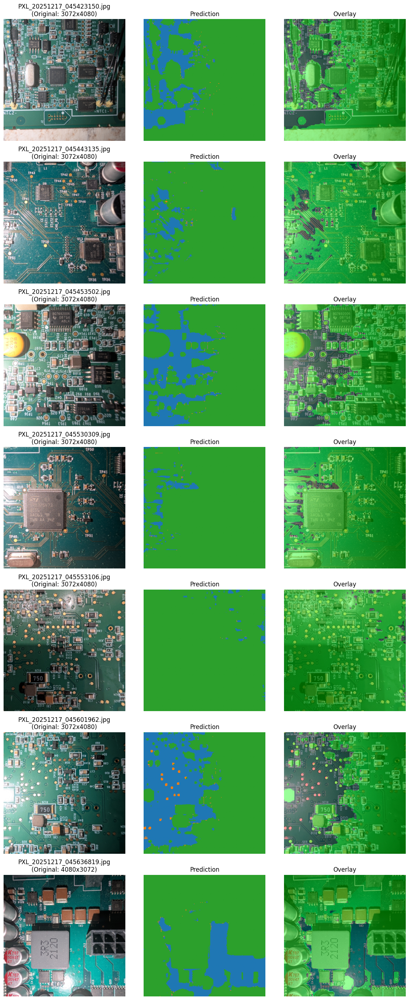


✓ Processed 7 real-world test images
Legend: Red = Metal (Class 1), Green = Non-metal (Class 2), Black = Background (Class 0)


In [19]:
# Load and test on real-world PCB images
from PIL import Image, ImageEnhance
import os

# Path to test images
if IN_COLAB:
    test_images_dir = Path("/content/drive/MyDrive/pcb-dataset/data/test_images/")
else:
    test_images_dir = Path("../data/test_images/")

print(f"Looking for test images in: {test_images_dir}")
print(f"Directory exists: {test_images_dir.exists()}")

if test_images_dir.exists():
    # Find all image files
    test_image_files = sorted(list(test_images_dir.glob("*.jpg")) +
                              list(test_images_dir.glob("*.png")) +
                              list(test_images_dir.glob("*.jpeg")))

    print(f"Found {len(test_image_files)} test images")

    if len(test_image_files) > 0:
        # Process and visualize predictions
        model.eval()

        num_images = len(test_image_files)
        fig, axes = plt.subplots(num_images, 3, figsize=(12, 4 * num_images))
        if num_images == 1:
            axes = axes.reshape(1, -1)

        with torch.no_grad():
            for idx, img_path in enumerate(test_image_files):
                # Load image
                img_pil = Image.open(img_path).convert('RGB')

                original_size = img_pil.size

                # Resize to 256x256 (center crop then resize)
                # First resize so smallest dimension is 256
                aspect = img_pil.size[0] / img_pil.size[1]
                if aspect > 1:
                    new_size = (int(256 * aspect), 256)
                else:
                    new_size = (256, int(256 / aspect))
                img_pil_resized = img_pil.resize(new_size, Image.Resampling.LANCZOS)

                # Center crop to 256x256
                left = (img_pil_resized.size[0] - 256) // 2
                top = (img_pil_resized.size[1] - 256) // 2
                img_pil_cropped = img_pil_resized.crop((left, top, left + 256, top + 256))

                # Convert to tensor
                img_array = np.array(img_pil_cropped)
                img_tensor = torch.from_numpy(img_array).permute(2, 0, 1).float() / 255.0
                img_tensor = img_tensor.unsqueeze(0).to(device)

                # Run inference
                output = model(img_tensor)
                pred = output.argmax(dim=1).squeeze(0).cpu().numpy()

                # Visualize
                # Original image
                axes[idx, 0].imshow(img_pil_cropped)
                axes[idx, 0].set_title(f'{img_path.name}\n(Original: {original_size[0]}x{original_size[1]})')
                axes[idx, 0].axis('off')

                # Prediction mask
                axes[idx, 1].imshow(pred, cmap='tab10', vmin=0, vmax=10)
                axes[idx, 1].set_title('Prediction')
                axes[idx, 1].axis('off')

                # Overlay
                img_np = np.array(img_pil_cropped).astype(float) / 255.0
                mask_colored = np.zeros_like(img_np)
                mask_colored[pred == 1] = [1, 0, 0]  # Red for metal (class 1)
                mask_colored[pred == 2] = [0, 1, 0]  # Green for non-metal (class 2)
                overlay = (0.6 * img_np + 0.4 * mask_colored)
                axes[idx, 2].imshow(overlay)
                axes[idx, 2].set_title('Overlay')
                axes[idx, 2].axis('off')

        plt.tight_layout()
        plt.show()

        print(f"\n Processed {len(test_image_files)} real-world test images")
        print("Legend: Red = Metal (Class 1), Green = Non-metal (Class 2), Black = Background (Class 0)")
    else:
        print("No image files found in test_images directory")
else:
    print(f"\n Test images directory not found: {test_images_dir}")
    print("Skipping real-world image testing")

## Visualize Predicitons

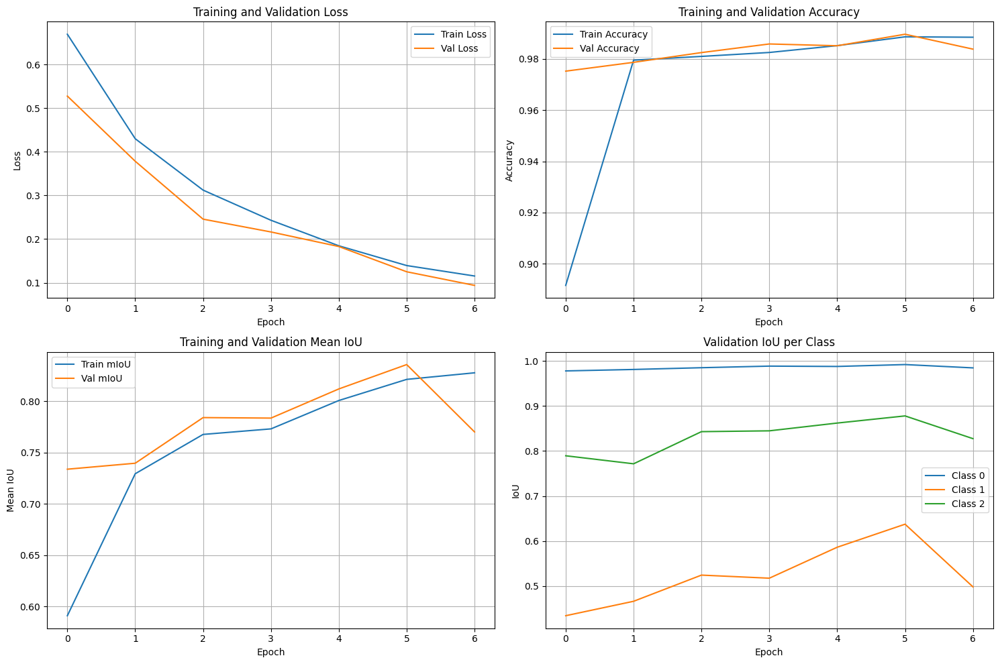

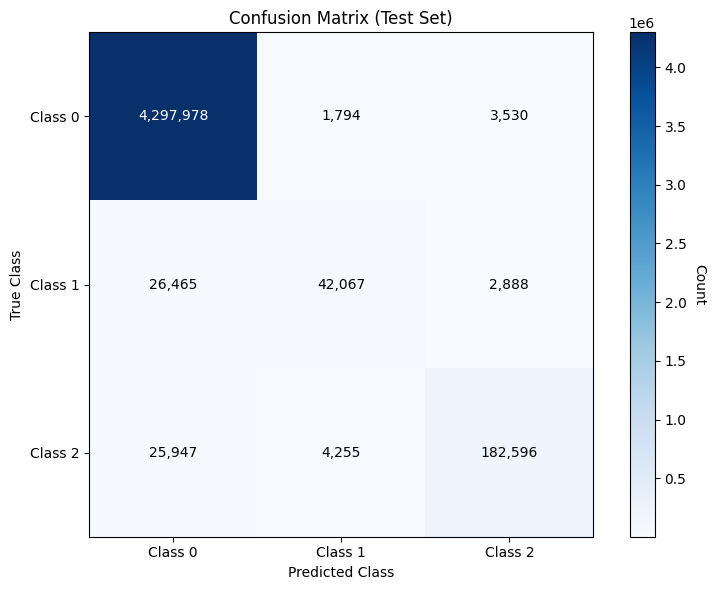


Generating prediction visualizations...


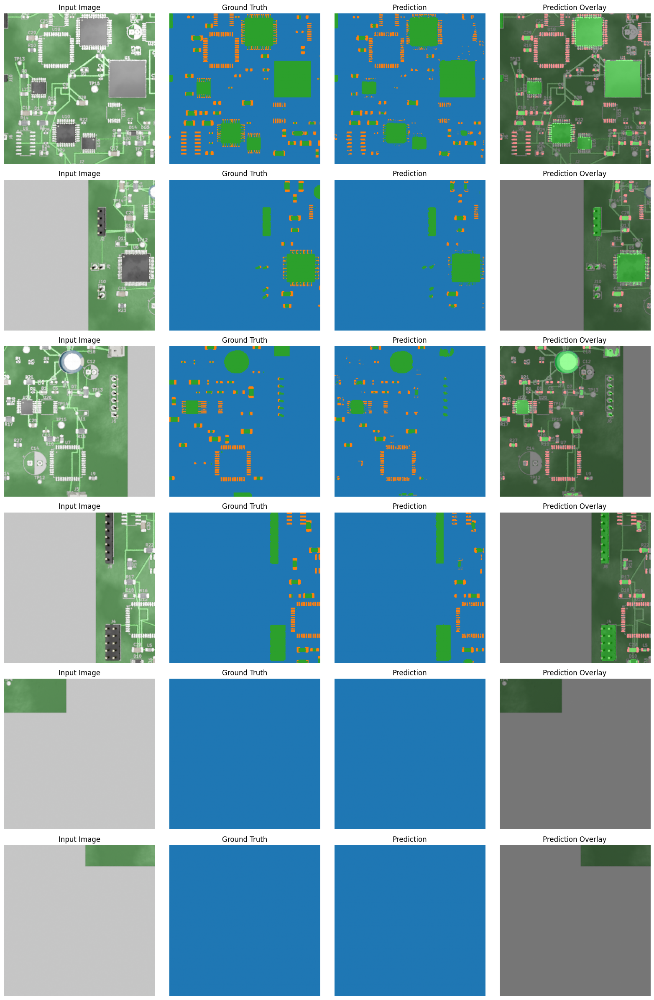


Analyzing failure cases...

Top 4 samples with highest error rates:


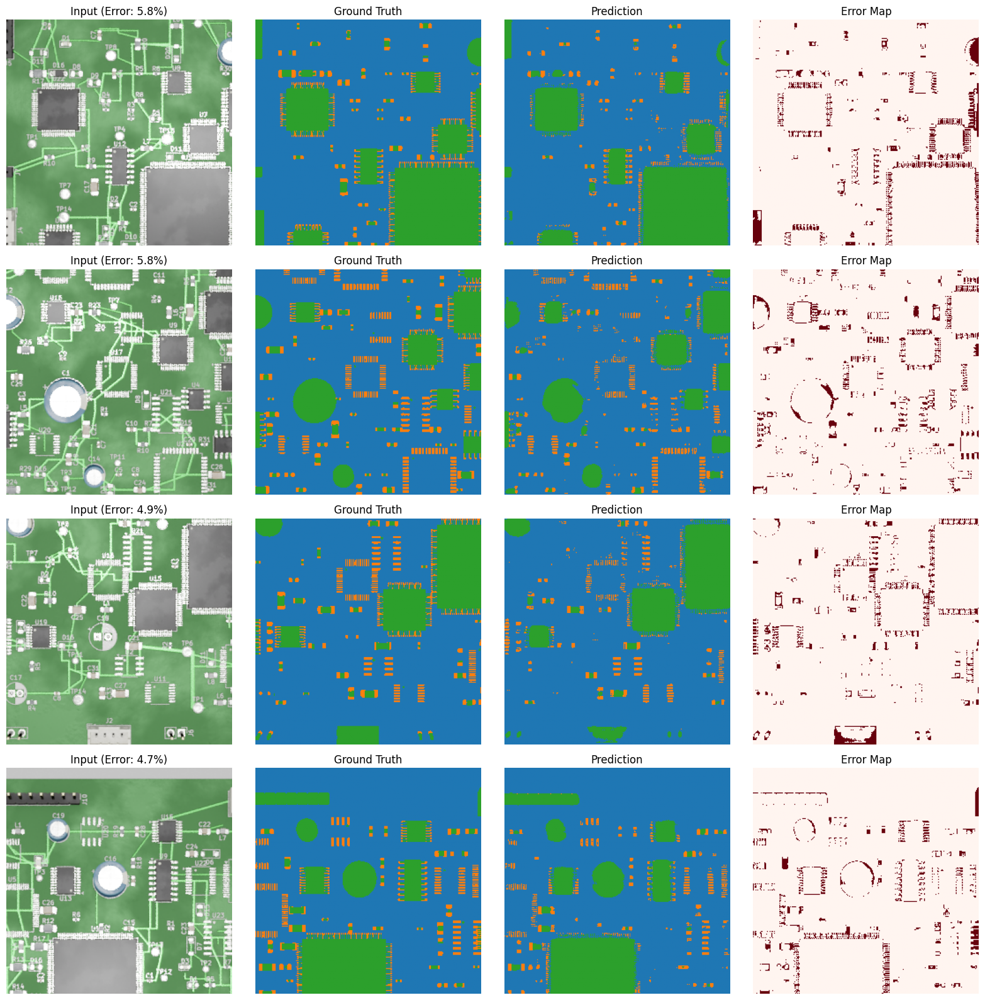


Visualization complete!


In [12]:
# Plot training curves
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Loss curves
axes[0, 0].plot(history['train_loss'], label='Train Loss')
axes[0, 0].plot(history['val_loss'], label='Val Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Training and Validation Loss')
axes[0, 0].legend()
axes[0, 0].grid(True)

# Accuracy curves
axes[0, 1].plot(history['train_acc'], label='Train Accuracy')
axes[0, 1].plot(history['val_acc'], label='Val Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Accuracy')
axes[0, 1].set_title('Training and Validation Accuracy')
axes[0, 1].legend()
axes[0, 1].grid(True)

# Mean IoU curves
train_miou = [np.mean(iou) for iou in history['train_iou']]
val_miou = [np.mean(iou) for iou in history['val_iou']]
axes[1, 0].plot(train_miou, label='Train mIoU')
axes[1, 0].plot(val_miou, label='Val mIoU')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Mean IoU')
axes[1, 0].set_title('Training and Validation Mean IoU')
axes[1, 0].legend()
axes[1, 0].grid(True)

# Per-class IoU on validation set
for i in range(3):
    val_class_iou = [iou[i] for iou in history['val_iou']]
    axes[1, 1].plot(val_class_iou, label=f'Class {i}')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('IoU')
axes[1, 1].set_title('Validation IoU per Class')
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.show()

# Visualize confusion matrix as heatmap
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(conf_matrix, cmap='Blues')

# Add colorbar
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel('Count', rotation=-90, va="bottom")

# Set ticks
ax.set_xticks(np.arange(3))
ax.set_yticks(np.arange(3))
ax.set_xticklabels([f'Class {i}' for i in range(3)])
ax.set_yticklabels([f'Class {i}' for i in range(3)])

# Add text annotations
for i in range(3):
    for j in range(3):
        text = ax.text(j, i, f'{conf_matrix[i, j]:,}',
                      ha="center", va="center", color="black" if conf_matrix[i, j] < conf_matrix.max()/2 else "white")

ax.set_title('Confusion Matrix (Test Set)')
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class')
plt.tight_layout()
plt.show()

# Visualize predictions vs ground truth
print("\nGenerating prediction visualizations...")
model.eval()

num_samples_to_show = 6
fig, axes = plt.subplots(num_samples_to_show, 4, figsize=(16, 4*num_samples_to_show))

sample_count = 0
with torch.no_grad():
    for images, masks in test_loader:
        if sample_count >= num_samples_to_show:
            break

        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()

        images_np = images.cpu().numpy()
        masks_np = masks.cpu().numpy()

        for idx in range(images.shape[0]):
            if sample_count >= num_samples_to_show:
                break

            # Original image
            img = np.transpose(images_np[idx], (1, 2, 0))
            axes[sample_count, 0].imshow(img)
            axes[sample_count, 0].set_title('Input Image')
            axes[sample_count, 0].axis('off')

            # Ground truth mask
            axes[sample_count, 1].imshow(masks_np[idx], cmap='tab10', vmin=0, vmax=10)
            axes[sample_count, 1].set_title('Ground Truth')
            axes[sample_count, 1].axis('off')

            # Prediction
            axes[sample_count, 2].imshow(preds[idx], cmap='tab10', vmin=0, vmax=10)
            axes[sample_count, 2].set_title('Prediction')
            axes[sample_count, 2].axis('off')

            # Overlay prediction on image
            mask_colored = np.zeros_like(img)
            mask_colored[preds[idx] == 1] = [1, 0, 0]  # Red for class 1
            mask_colored[preds[idx] == 2] = [0, 1, 0]  # Green for class 2
            overlay = (0.6 * img + 0.4 * mask_colored)
            axes[sample_count, 3].imshow(overlay)
            axes[sample_count, 3].set_title('Prediction Overlay')
            axes[sample_count, 3].axis('off')

            sample_count += 1

plt.tight_layout()
plt.show()

# Analyze failure cases (highest error samples)
print("\nAnalyzing failure cases...")
model.eval()

errors = []
with torch.no_grad():
    for batch_idx, (images, masks) in enumerate(test_loader):
        images = images.to(device)
        masks_np = masks.numpy()

        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()

        for idx in range(images.shape[0]):
            # Calculate pixel error rate
            error_rate = np.mean(preds[idx] != masks_np[idx])
            errors.append({
                'batch_idx': batch_idx,
                'sample_idx': idx,
                'error_rate': error_rate,
                'image': images[idx].cpu().numpy(),
                'mask': masks_np[idx],
                'pred': preds[idx]
            })

# Sort by error rate
errors.sort(key=lambda x: x['error_rate'], reverse=True)

# Show top 4 failure cases
print(f"\nTop 4 samples with highest error rates:")
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for i in range(min(4, len(errors))):
    error_info = errors[i]

    # Original image
    img = np.transpose(error_info['image'], (1, 2, 0))
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f'Input (Error: {error_info["error_rate"]*100:.1f}%)')
    axes[i, 0].axis('off')

    # Ground truth
    axes[i, 1].imshow(error_info['mask'], cmap='tab10', vmin=0, vmax=10)
    axes[i, 1].set_title('Ground Truth')
    axes[i, 1].axis('off')

    # Prediction
    axes[i, 2].imshow(error_info['pred'], cmap='tab10', vmin=0, vmax=10)
    axes[i, 2].set_title('Prediction')
    axes[i, 2].axis('off')

    # Error map (red = incorrect)
    error_map = (error_info['pred'] != error_info['mask']).astype(float)
    axes[i, 3].imshow(error_map, cmap='Reds')
    axes[i, 3].set_title('Error Map')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

print("\nVisualization complete!")

## Notes & Future Work

This training is an example of how the dataset generator can be used and is not meant to portray incredible accuracy or results. The dataset generator needs significant tuning to be useful. As a proof of concept this serves a great purpose.